# Regularized Geometric Computations for 2D Generative Models

In [1]:
# Import required packages
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

import normflows as nf
from torchebm.core import BaseEnergyFunction
from torchebm.samplers import LangevinDynamics
from torchebm.losses import ContrastiveDivergence
from torchebm.datasets import GaussianMixtureDataset, PinwheelDataset, CheckerboardDataset

import numpy as np

import math

from matplotlib import pyplot as plt
import matplotlib as mpl

from tqdm import tqdm

from typing import List, Any

from torch_geometry.manifolds import nSphere, LambdaManifold
from torch_geometry.prob_geodesics import ProbGEORCE, ProbGEORCE_Embedded, ProbGEORCE_Euclidean
from torch_geometry.prob_geodesics import ProbGEORCE_Adaptive, ProbGEORCE_Embedded_Adaptive, ProbGEORCE_Euclidean_Adaptive

from torch_geometry.prob_means import ProbGEORCEFM, ProbGEORCEFM_Embedded, ProbGEORCEFM_Euclidean
from torch_geometry.prob_means import ProbGEORCEFM_Adaptive, ProbGEORCEFM_Embedded_Adaptive, ProbGEORCEFM_Euclidean_Adaptive

from torch_geometry.manifolds import nEuclidean


## Hyper-parameters

In [2]:
M = nEuclidean(dim=2)

In [3]:
lam = 20.0
lr_rate=0.01
beta1=0.5
beta2=0.5
eps=1e-8

max_iter = 1000
tol = 1e-4
N_grid = 100
grid_size = 100

v_scale = 1.0

In [4]:
model_path = '../models/gen2d/'
device = 'cpu'

In [5]:
figure_path = "../figures/gen2d/"
cmap_style = "viridis"

In [6]:
model_computations = {} #For storing computations

## Helper functions

### Regularization

In [7]:
#error to a unit circle
def reg_fun(x, prob_model):

    shape = x.shape

    if x.ndim > 1:
        return -torch.sum(prob_model(x.reshape(-1,shape[-1])))
    else:
        return -prob_model(x.reshape(-1,len(x))).squeeze()
    

### Plotting

In [8]:
def plot_geodesic_plot(ax, xv, yv, grid_density, curve, title, fontsize=14):

    # Filled contour
    cf = ax.contourf(
        xv,
        yv,
        grid_density,
        levels=50,
        cmap=cmap_style,
        alpha=0.9
    )
    
    # Optional: add contour lines for structure
    contours = ax.contour(
        xv,
        yv,
        grid_density,
        levels=10,
        colors="k",
        linewidths=0.5,
        alpha=0.7
    )
    
    # Plot your curve on top
    ax.plot(curve[:,0], curve[:,1], color="red", linewidth=2, label="Curve 1")
    
    # Mark start and end points
    ax.scatter(curve[0,0], curve[0,1], color="green", s=50, label="Start", marker="o", edgecolors='k', zorder=5)
    ax.scatter(curve[-1,0], curve[-1,1], color="green", s=50, label="End", marker="o", edgecolors='k', zorder=5)
    
    # Colorbar
    #cbar = fig.colorbar(cf, ax=ax, shrink=0.8)
    #cbar.set_label("Density", fontsize=12)
    
    # Aesthetics
    ax.set_title(title, fontsize=fontsize, weight='bold')
    ax.set_aspect('equal')
    #ax.legend(fontsize=12)

    ax.tick_params(
        axis='y',
        which='both',
        left=False,
        right=False,
        labelleft=False
    )
    ax.get_xaxis().set_visible(False)
    
    
    # Optional: remove top/right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    return ax


In [9]:
def plot_fm_plot(ax, xv, yv, grid_density, z_mu, zi, title, fontsize=14):

    # Filled contour
    cf = ax.contourf(
        xv,
        yv,
        grid_density,
        levels=50,
        cmap=cmap_style,
        alpha=0.9
    )
    
    # Optional: add contour lines for structure
    contours = ax.contour(
        xv,
        yv,
        grid_density,
        levels=10,
        colors="k",
        linewidths=0.5,
        alpha=0.7
    )

    # Plot curves
    for c in zi:
        ax.plot(c[:,0], c[:,1], color="red", linewidth=2, alpha=0.5)
    
    # Mark some special point (as in your example)
    ax.scatter(z_mu[0], z_mu[1], color="blue", s=50, label="z_mu", zorder=10)

    # Plot data_sample points
    ax.scatter(
        zi[:,-1,0], 
        zi[:,-1,1], 
        color="white",      # choose a contrasting color
        edgecolor="black",  # optional black edge for visibility
        s=25,               # marker size
        alpha=0.8,          # slightly transparent
        label="Data Sample"
    )
    
    # Colorbar
    #cbar = fig.colorbar(cf, ax=ax, shrink=0.8)
    #cbar.set_label("Density", fontsize=12)
    
    # Aesthetics
    ax.set_title(title, fontsize=fontsize, weight='bold')
    ax.set_aspect('equal')
    #ax.legend(fontsize=12)

    ax.tick_params(
        axis='y',
        which='both',
        left=False,
        right=False,
        labelleft=False
    )
    ax.get_xaxis().set_visible(False)
    
    # Optional: remove top/right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    return ax

In [10]:
def plot_ode_curves(ax, xv, yv, grid_density, ode_curves, v, title, fontsize=14):

    # Filled contour
    cf = ax.contourf(xv.cpu().numpy(), yv.cpu().numpy(),
                     grid_density, levels=50, cmap=cmap_style, alpha=0.9)

    # Contour lines
    ax.contour(xv.cpu().numpy(), yv.cpu().numpy(),
               grid_density, levels=10, colors="k", linewidths=0.5, alpha=0.7)

    # Plot curves
    for c,direction in zip(ode_curves, v):
        ax.plot(c[:,0], c[:,1], color="red", linewidth=2, alpha=0.5)

        # --- initial direction arrow ---
        direction = 0.5*direction / np.linalg.norm(direction)
        
        ax.quiver(
        c[0,0], c[0,1],       # start point
        direction[0], direction[1],  # vector
        angles='xy', scale_units='xy', scale=1,
        color='black', width=0.005
    )

        # End point marker
        p_end = c[-1]
        ax.scatter(
            p_end[0], p_end[1],
            color="green", edgecolor="black",
            s=25, zorder=5
        )

    # Starting points (center)
    ax.scatter(
        [c[0,0] for c in ode_curves],
        [c[0,1] for c in ode_curves],
        color="blue", s=50, zorder=6
    )

    # Colorbar
    #cbar = fig.colorbar(cf, ax=ax, shrink=0.8)
    #cbar.set_label("Density", fontsize=12)
    
    # Aesthetics
    ax.set_title(title, fontsize=fontsize, weight='bold')
    ax.set_aspect('equal')
    #ax.legend(fontsize=12)

    ax.tick_params(
                axis='y',
                which='both',
                left=False,
                right=False,
                labelleft=False
            )
    ax.get_xaxis().set_visible(False)
    
    # Optional: remove top/right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    return ax


## Energy-Based Model

### Loading model

In [11]:
ebm_computations = {}

In [12]:
dataset = CheckerboardDataset(
        n_samples = 100,
        range_limit = 2.0,
        noise = 0.05,
        device=device,
        seed = 2712
        )

In [13]:
save_path = ''.join((model_path, 'ebm/checkboard.pt'))
INPUT_DIM = 2
HIDDEN_DIM = 128
checkpoint = torch.load(save_path, weights_only=False, map_location=torch.device(device))

class MLPEnergy(BaseEnergyFunction):
    """A simple MLP to act as the energy function."""

    def __init__(self, input_dim: int, hidden_dim: int = 64):
        super().__init__()
        self.network = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 1),  # Output a single scalar energy value
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.network(x).squeeze(-1)

ebm_model = MLPEnergy(INPUT_DIM, HIDDEN_DIM).to(device)

# Load state dict
ebm_model.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [14]:
ebm_reg_fun = lambda x: reg_fun(x, lambda z: -ebm_model(z))

### Defining grid

In [15]:
plot_range = 3.0
x_coords = torch.linspace(-plot_range, plot_range, grid_size, device=device)
y_coords = torch.linspace(-plot_range, plot_range, grid_size, device=device)
ebm_xv, ebm_yv = torch.meshgrid(x_coords, y_coords, indexing="xy")
ebm_grid = torch.stack([ebm_xv.flatten(), ebm_yv
                        .flatten()], dim=1)

# Calculate energy on the grid
ebm_model.eval()
with torch.no_grad():
    energy_values = ebm_model(ebm_grid).cpu().numpy().reshape(grid_size, grid_size)

log_prob_values = -energy_values
log_prob_values -= np.max(log_prob_values)  # shift for numerical stability

ebm_grid_density = np.exp(log_prob_values)

# Min-max normalization
ebm_grid_density -= ebm_grid_density.min()
ebm_grid_density /= ebm_grid_density.max()

In [16]:
ebm_computations['x_grid'] = ebm_xv
ebm_computations['y_grid'] = ebm_yv
ebm_computations['grid_density'] = ebm_grid_density

### Computing geodesics

In [17]:
ProbGeodesic = ProbGEORCE_Euclidean_Adaptive(reg_fun=ebm_reg_fun,
                                             init_fun=None,
                                             lam=lam,
                                             N=N_grid,
                                             tol=tol,
                                             max_iter=max_iter,
                                             lr_rate=lr_rate,
                                             beta1=beta1,
                                             beta2=beta2,
                                             eps=eps,
                                             device=device,
                                            )

In [18]:
# Coordinates
x1 = torch.tensor([-1.5, -0.5])   # top of moon 1
x2 = torch.tensor([2.0, 1.0])  # bottom of moon 2

In [19]:
curve1 = ProbGeodesic(x1,x2)

In [20]:
ebm_computations['geodesic_curve'] = curve1

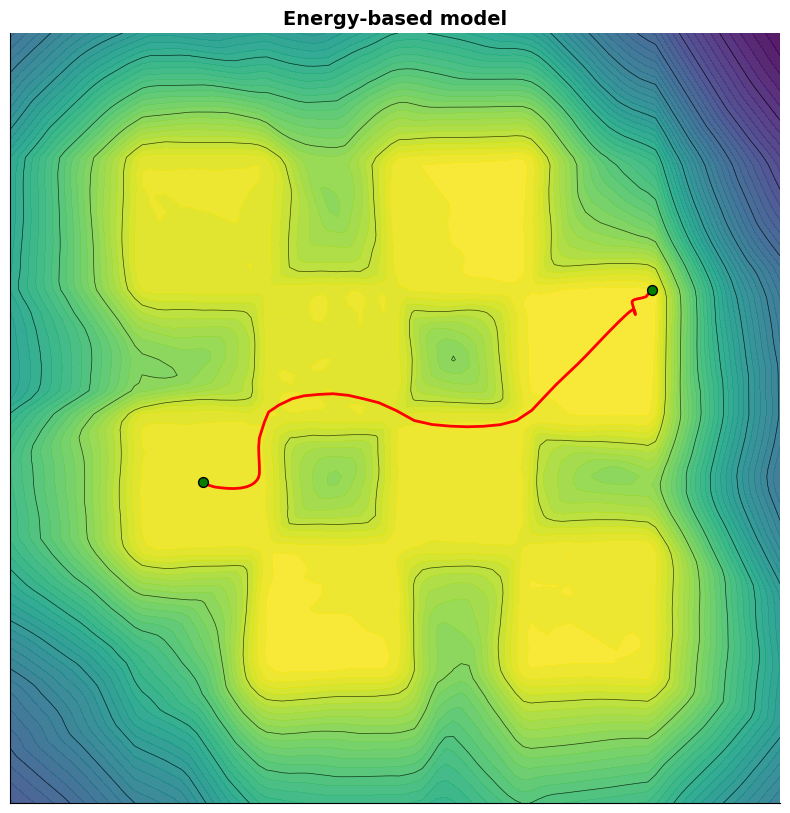

In [21]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_geodesic_plot(ax, ebm_xv, ebm_yv, ebm_grid_density, curve1, title="Energy-based model")


### Fréchet mean

In [22]:
prob_mean_adaptive = ProbGEORCEFM_Euclidean_Adaptive(reg_fun=ebm_reg_fun,
                                                     init_fun=None,
                                                     lam=lam,
                                                     N_grid=N_grid,
                                                     tol=tol,
                                                     max_iter=max_iter,
                                                     lr_rate=lr_rate,
                                                     beta1=beta1,
                                                     beta2=beta2,
                                                     eps=eps,
                                                     device=device,
                                                    )

In [23]:
data_sample = dataset.get_data()

In [24]:
z_mu, zi = prob_mean_adaptive(data_sample)

In [25]:
ebm_computations['frechet_mean'] = {'z_mu': z_mu, 'zi': zi, 'lam_norm': prob_mean_adaptive.lam_norm}

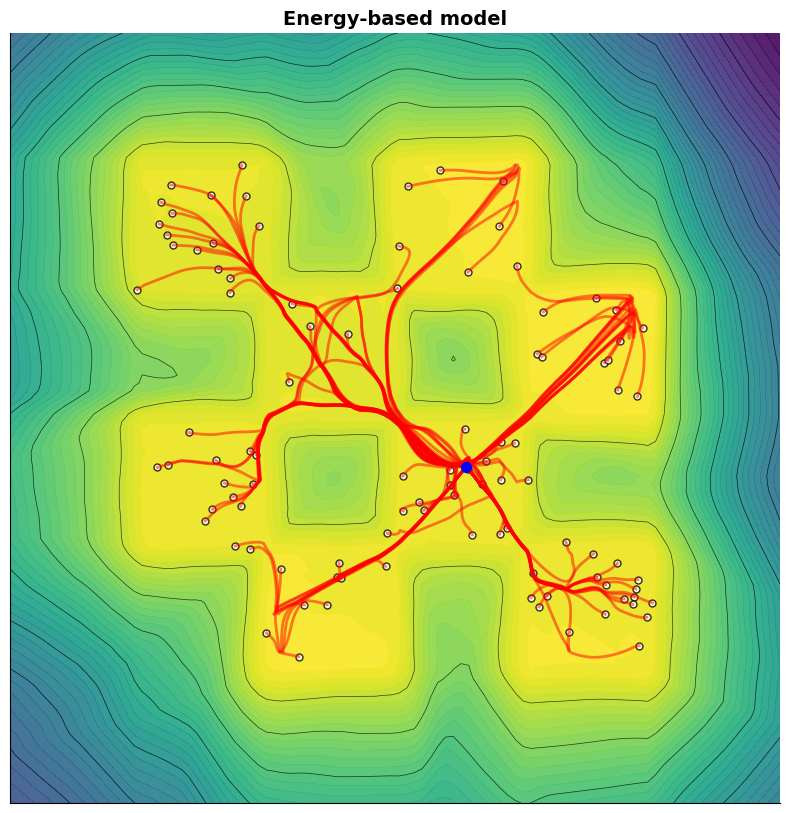

In [26]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_fm_plot(ax, ebm_xv, ebm_yv, ebm_grid_density, z_mu, zi, title="Energy-based model")

### ODE curves

In [27]:
Mlambda = LambdaManifold(M=M, S=ebm_reg_fun, lam=lam)

In [28]:
x0 = torch.tensor([0.5, -0.5])   # top of moon 1

In [29]:
theta = torch.linspace(0, 2*torch.pi,10)
v = v_scale*torch.stack([torch.cos(theta), torch.sin(theta)]).T

In [30]:
ode_curve = torch.stack([Mlambda.Exp_ode(x0, v0) for v0 in v]).detach().numpy()

In [31]:
ebm_computations['ode'] = {'x0': x0, 'v': v, 'curve': ode_curve}

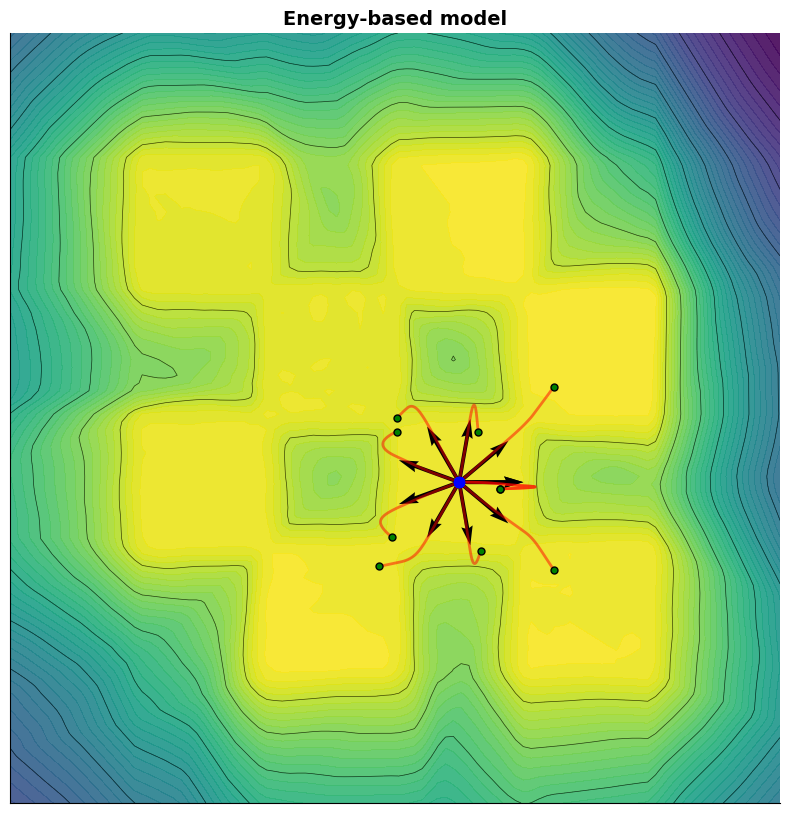

In [32]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_ode_curves(ax, ebm_xv, ebm_yv, ebm_grid_density, ode_curve, v, title="Energy-based model")

In [33]:
model_computations['EBM'] = ebm_computations #Energy-based model

## Normalizing Flows

In [34]:
nf_computations = {}

### Loading model

In [35]:
target = nf.distributions.TwoMoons()

In [36]:
save_path = ''.join((model_path, 'nf/two_moons.pt'))
checkpoint = torch.load(save_path, weights_only=False, map_location=torch.device('cpu'))

# Reconstruct the model architecture first
base = nf.distributions.base.DiagGaussian(2)
flows = []
for i in range(32):
    param_map = nf.nets.MLP([1, 64, 64, 2], init_zeros=True)
    flows.append(nf.flows.AffineCouplingBlock(param_map))
    flows.append(nf.flows.Permute(2, mode='swap'))
nf_model = nf.NormalizingFlow(base, flows)

# Load state dict
nf_model.load_state_dict(checkpoint['model_state_dict'])

# Access loss history
loss_hist = checkpoint['loss_history']


In [37]:
nf_reg_fun = lambda x: reg_fun(x, lambda z: nf_model.log_prob(z))

### Defining grid

In [38]:
nf_xv, nf_yv = torch.meshgrid(torch.linspace(-3, 3, grid_size), torch.linspace(-3, 3, grid_size))
nf_grid_size = torch.cat([nf_xv.unsqueeze(2), nf_yv.unsqueeze(2)], 2).view(-1, 2)
nf_grid_size = nf_grid_size.to(device)

log_prob = target.log_prob(nf_grid_size).detach().numpy().reshape(*nf_xv.shape)
log_prob -= np.max(log_prob)  # shift for numerical stability

nf_grid_density = np.exp(log_prob)
nf_grid_density[np.isnan(nf_grid_density)] = 0

# Min-max normalization
nf_grid_density -= nf_grid_density.min()
nf_grid_density /= nf_grid_density.max()

/home/fmry/anaconda3/lib/python3.12/site-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [39]:
nf_computations['x_grid'] = nf_xv
nf_computations['y_grid'] = nf_yv
nf_computations['grid_density'] = nf_grid_density

### Computing geodesics

In [40]:
ProbGeodesic = ProbGEORCE_Euclidean_Adaptive(reg_fun=nf_reg_fun,
                                             init_fun=None,
                                             lam=lam,
                                             N=N_grid,
                                             tol=tol,
                                             max_iter=max_iter,
                                             lr_rate=lr_rate,
                                             beta1=beta1,
                                             beta2=beta2,
                                             eps=eps,
                                             device=device,
                                            )

In [41]:
# Coordinates
x1 = torch.tensor([-2.0, 0.5])   # top of moon 1
x2 = torch.tensor([1.6, -1.2])  # bottom of moon 2

# Coordinates
y1 = torch.tensor([1.6, 1.2])  # top of moon 2
y2 = torch.tensor([1.6, -1.2])  # bottom of moon 2

In [42]:
curve1 = ProbGeodesic(x1,x2)

In [43]:
curve2 = ProbGeodesic(y1,y2)

In [44]:
nf_computations['geodesic_curve'] = curve2

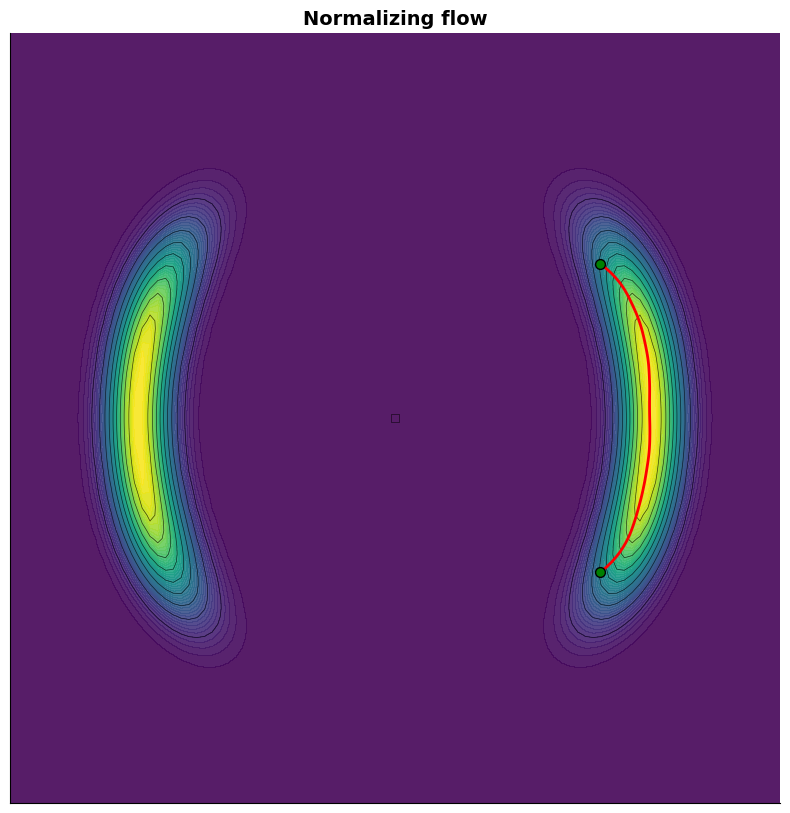

In [45]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_geodesic_plot(ax, nf_xv, nf_yv, nf_grid_density, curve2, title="Normalizing flow")

### Fréchet mean

In [46]:
data_sample = target.sample(100).to(device)

In [47]:
prob_mean_adaptive = ProbGEORCEFM_Euclidean_Adaptive(reg_fun=nf_reg_fun,
                                                     init_fun=None,
                                                     lam=lam,
                                                     N_grid=N_grid,
                                                     tol=tol,
                                                     max_iter=max_iter,
                                                     lr_rate=lr_rate,
                                                     beta1=beta1,
                                                     beta2=beta2,
                                                     eps=eps,
                                                     device=device,
                                                    )

In [48]:
z_mu, zi = prob_mean_adaptive(data_sample)

In [49]:
nf_computations['frechet_mean'] = {'z_mu': z_mu, 'zi': zi, 'lam_norm': prob_mean_adaptive.lam_norm}

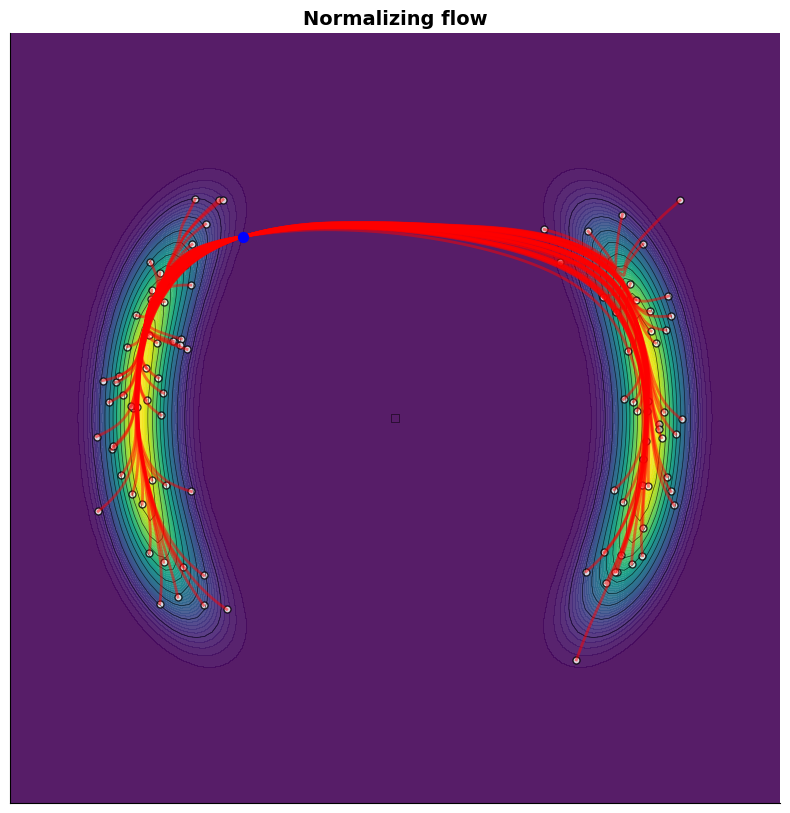

In [50]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_fm_plot(ax, nf_xv, nf_yv, nf_grid_density, z_mu, zi, title="Normalizing flow")

### ODE curves

In [51]:
Mlambda = LambdaManifold(M=M, S=nf_reg_fun, lam=lam)

In [52]:
x0 = torch.tensor([-1.6, -1.2])

In [53]:
theta = torch.linspace(0, 2*torch.pi,10)
v = v_scale*torch.stack([torch.cos(theta), torch.sin(theta)]).T

In [54]:
ode_curve = torch.stack([Mlambda.Exp_ode(x0, v0) for v0 in v]).detach().numpy()

In [55]:
nf_computations['ode'] = {'x0': x0, 'v': v, 'curve': ode_curve}

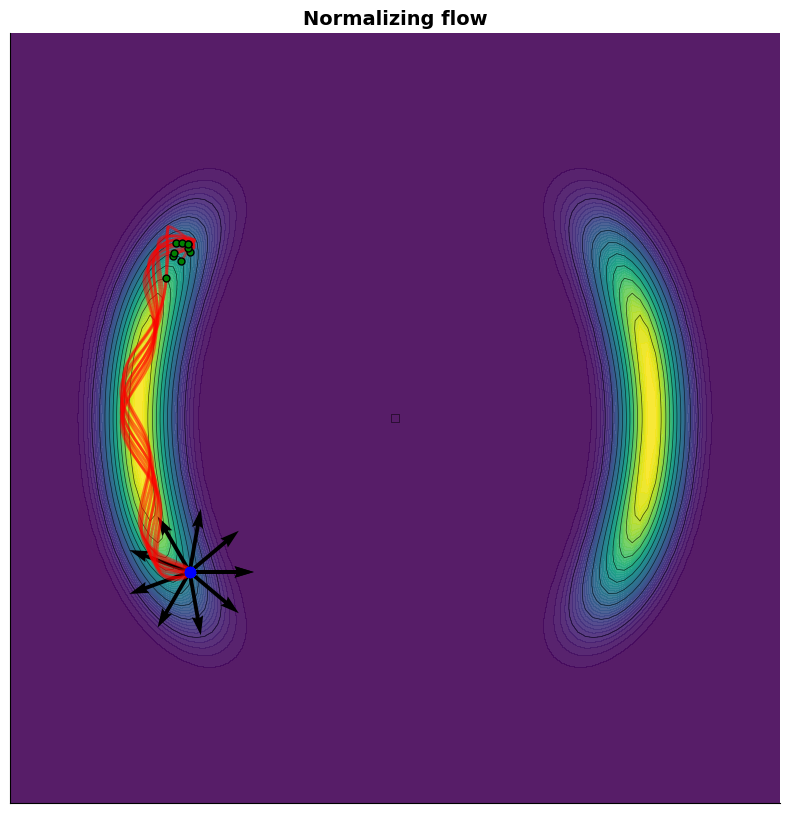

In [56]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_ode_curves(ax, nf_xv, nf_yv, nf_grid_density, ode_curve, v, title="Normalizing flow")

In [57]:
model_computations['NF'] = nf_computations #Normalizing flow

## Autoregressive Model (AR)

In [58]:
ar_computations = {}

### Loading model

In [59]:
class SimpleAutoregressive2D(nn.Module):
    def __init__(self, hidden_dim=64):
        super().__init__()
        # p(x1): learnable Gaussian parameters
        self.x1_mean = nn.Parameter(torch.zeros(1))
        self.x1_logstd = nn.Parameter(torch.zeros(1))

        # p(x2 | x1): MLP outputs mean and logstd
        self.net = nn.Sequential(
            nn.Linear(1, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, 2)
        )

    def forward(self, x):
        x1, x2 = x[:, 0:1], x[:, 1:2]
        # log p(x1)
        logp_x1 = (-0.5 * ((x1 - self.x1_mean)**2 / self.x1_logstd.exp()**2)
                   - self.x1_logstd
                   - 0.5 * torch.log(torch.tensor(2 * torch.pi))).sum(-1)

        # log p(x2 | x1)
        out = self.net(x1)
        mean2, logstd2 = out[:, 0:1], out[:, 1:2]
        logp_x2_given_x1 = (-0.5 * ((x2 - mean2)**2 / logstd2.exp()**2)
                            - logstd2
                            - 0.5 * torch.log(torch.tensor(2 * torch.pi))).sum(-1)
        return logp_x1 + logp_x2_given_x1

    def sample(self, n=1000):
        # sample x1 ~ N(mean1, std1)
        x1 = self.x1_mean + self.x1_logstd.exp() * torch.randn(n, 1)
        # sample x2 | x1
        out = self.net(x1)
        mean2, logstd2 = out[:, 0:1], out[:, 1:2]
        x2 = mean2 + logstd2.exp() * torch.randn(n, 1)
        return torch.cat([x1, x2], dim=1)

In [60]:
save_path = ''.join((model_path, 'ar/sinus.pt'))
checkpoint = torch.load(save_path, weights_only=False, map_location=torch.device(device))

ar_model = SimpleAutoregressive2D().to(device)

# Load state dict
ar_model.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [61]:
ar_reg_fun = lambda x: reg_fun(x, lambda z: ar_model(z))

### Defining grid

In [62]:
ar_model.eval()
with torch.no_grad():
    # Define grid over input space
    x1_lin = torch.linspace(-2.0, 2.5, grid_size)
    x2_lin = torch.linspace(-2.0, 2.5, grid_size)
    ar_xv, ar_yv = torch.meshgrid(x1_lin, x2_lin, indexing="xy")
    ar_grid = torch.stack([ar_xv.flatten(), ar_yv.flatten()], dim=-1)

    # Compute model log-probability
    log_prob = ar_model(ar_grid).detach().numpy().reshape(*ar_xv.shape)
    log_prob -= np.max(log_prob)  # shift for numerical stability
    
    ar_grid_density = np.exp(log_prob)
    ar_grid_density[np.isnan(ar_grid_density)] = 0
    
    # Min-max normalization
    ar_grid_density -= ar_grid_density.min()
    ar_grid_density /= ar_grid_density.max()

In [63]:
ar_computations['x_grid'] = ar_xv
ar_computations['y_grid'] = ar_yv
ar_computations['grid_density'] = ar_grid_density

### Computing geodesics

In [64]:
ProbGeodesic = ProbGEORCE_Euclidean_Adaptive(reg_fun=ar_reg_fun,
                                             init_fun=None,
                                             lam=lam,
                                             N=N_grid,
                                             tol=tol,
                                             max_iter=max_iter,
                                             lr_rate=lr_rate,
                                             beta1=beta1,
                                             beta2=beta2,
                                             eps=eps,
                                             device=device,
                                            )

In [65]:
# Coordinates
x1 = torch.tensor([-0.5, math.sin(-2.0)])   # top of moon 1
x2 = torch.tensor([2.0, math.sin(2.0)])  # bottom of moon 2

In [66]:
curve1 = ProbGeodesic(x1,x2)

In [67]:
ar_computations['geodesic_curve'] = curve1

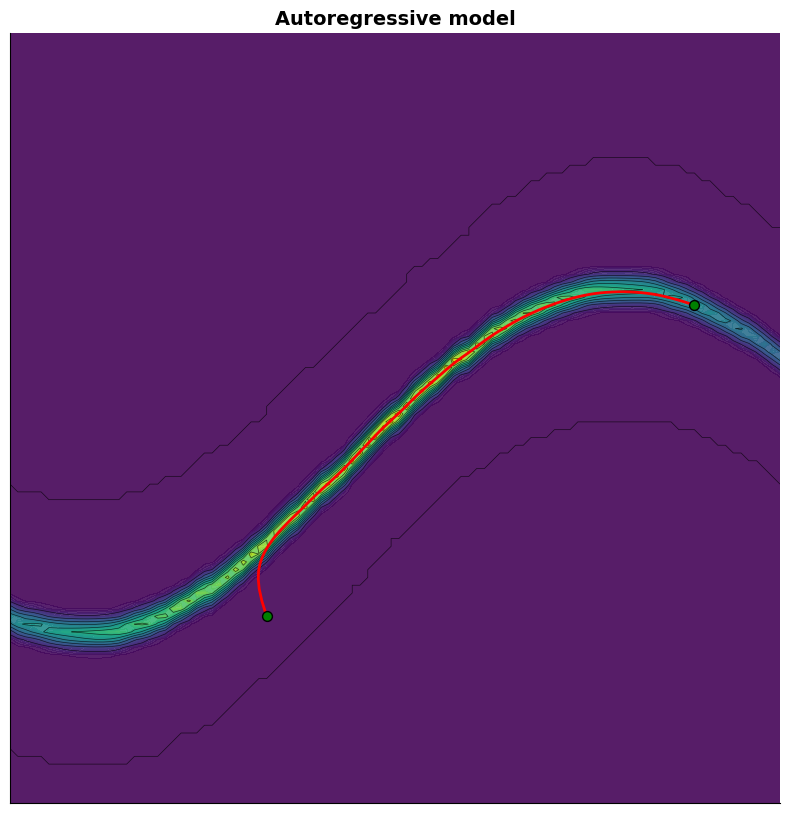

In [68]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_geodesic_plot(ax, ar_xv, ar_yv, ar_grid_density, curve1, title="Autoregressive model")

### Fréchet mean

In [69]:
data_sample = torch.stack([torch.linspace(0.0, 2.0, 100), torch.sin(torch.linspace(-1.0, 2.0, 100))]).T

In [70]:
prob_mean_adaptive = ProbGEORCEFM_Euclidean_Adaptive(reg_fun=ar_reg_fun,
                                                     init_fun=None,
                                                     lam=lam,
                                                     N_grid=N_grid,
                                                     tol=tol,
                                                     max_iter=max_iter,
                                                     lr_rate=lr_rate,
                                                     beta1=beta1,
                                                     beta2=beta2,
                                                     eps=eps,
                                                     device=device,
                                                    )

In [71]:
z_mu, zi = prob_mean_adaptive(data_sample)

In [72]:
ar_computations['frechet_mean'] = {'z_mu': z_mu, 'zi': zi, 'lam_norm': prob_mean_adaptive.lam_norm}

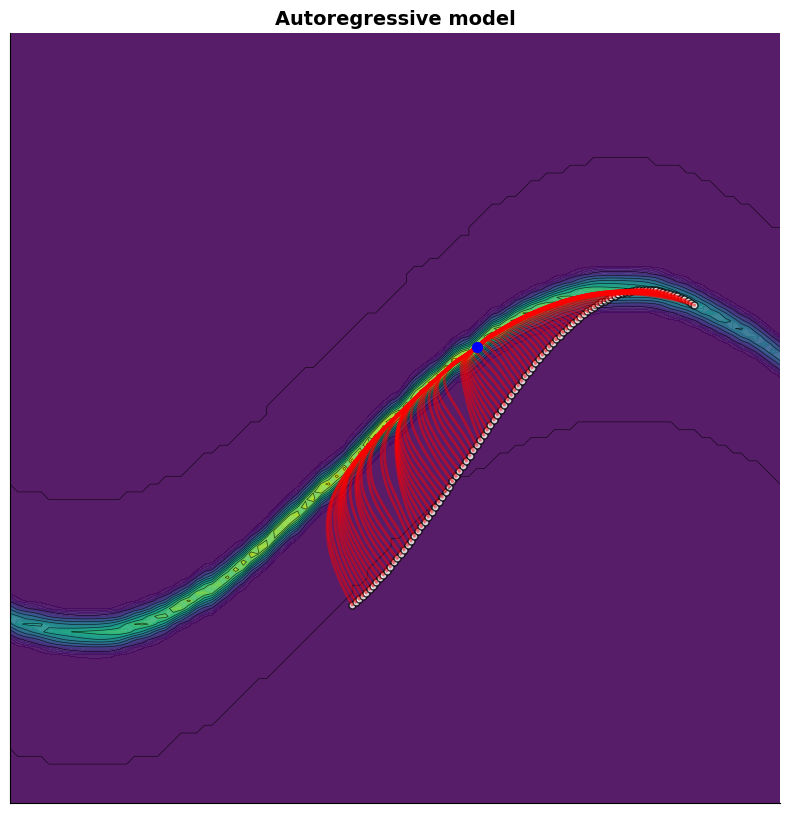

In [73]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_fm_plot(ax, ar_xv, ar_yv, ar_grid_density, z_mu, zi, title="Autoregressive model")

### ODE Curves

In [74]:
Mlambda = LambdaManifold(M=M, S=ar_reg_fun, lam=lam)

In [75]:
x0 = torch.tensor([1.0, 0.8])

x0 = torch.tensor([0.0, math.sin(0.0)])

In [76]:
theta = torch.linspace(0, 2*torch.pi,10)
v = v_scale*torch.stack([torch.cos(theta), torch.sin(theta)]).T

In [77]:
ode_curve = torch.stack([Mlambda.Exp_ode(x0, v0) for v0 in v]).detach().numpy()

In [78]:
ar_computations['ode'] = {'x0': x0, 'v': v, 'curve': ode_curve}

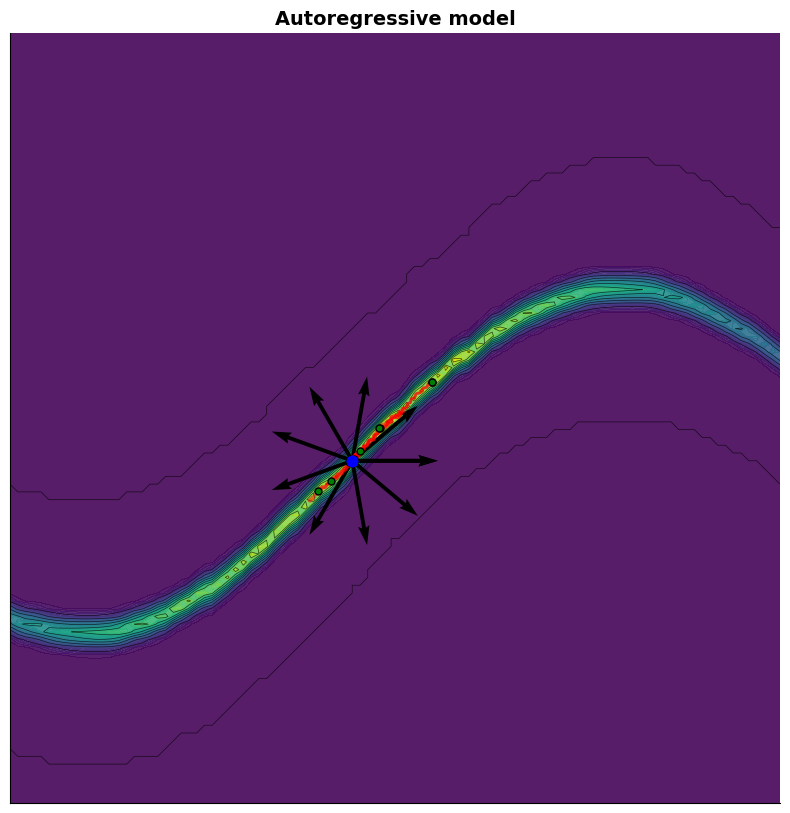

In [79]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_ode_curves(ax, ar_xv, ar_yv, ar_grid_density, ode_curve, v, title="Autoregressive model")

In [80]:
model_computations['AR'] = ar_computations #Autoregressive model

## VAE

In [81]:
vae_computations = {}

### Loading model

In [82]:
class VAE_3d(nn.Module):
        def __init__(self,
                     fc_h: List[int] = [3, 100],
                     fc_g: List[int] = [2, 100, 3],
                     fc_mu: List[int] = [100, 2],
                     fc_var: List[int] = [100, 2],
                     fc_h_act: List[Any] = [nn.ELU],
                     fc_g_act: List[Any] = [nn.ELU, nn.Identity],
                     fc_mu_act: List[Any] = [nn.Identity],
                     fc_var_act: List[Any] = [nn.Sigmoid]
                     ):
            super(VAE_3d, self).__init__()
        
            self.fc_h = fc_h
            self.fc_g = fc_g
            self.fc_mu = fc_mu
            self.fc_var = fc_var
            self.fc_h_act = fc_h_act
            self.fc_g_act = fc_g_act
            self.fc_mu_act = fc_mu_act
            self.fc_var_act = fc_var_act
            
            self.num_fc_h = len(fc_h)
            self.num_fc_g = len(fc_g)
            self.num_fc_mu = len(fc_mu)
            self.num_fc_var = len(fc_var)
            
            self.encoder = self.encode()
            self.mu_net = self.mu_layer()
            self.var_net = self.var_layer()
            self.decoder = self.decode()
            
            # for the gaussian likelihood
            self.log_scale = nn.Parameter(torch.Tensor([0.0]))
        
        def encode(self):
            
            layer = []
            
            for i in range(1, self.num_fc_h):
                layer.append(nn.Linear(self.fc_h[i-1], self.fc_h[i]))
                layer.append(self.fc_h_act[i-1]())
                #input_layer.append(self.activations_h[i](inplace=True))
                
            return nn.Sequential(*layer)
        
        def mu_layer(self):
            
            layer = []
            
            for i in range(1, self.num_fc_mu):
                layer.append(nn.Linear(self.fc_mu[i-1], self.fc_mu[i]))
                layer.append(self.fc_mu_act[i-1]())
                
            return nn.Sequential(*layer)
        
        def var_layer(self):
            
            layer = []
            
            for i in range(1, self.num_fc_var):
                layer.append(nn.Linear(self.fc_var[i-1], self.fc_var[i]))
                layer.append(self.fc_var_act[i-1]())
                
            return nn.Sequential(*layer)
        
        def rep_par(self, mu, std):
            
            eps = torch.randn_like(std)
            z = mu + (eps * std)
            return z
            
        def decode(self):
            
            layer = []
            
            for i in range(1, self.num_fc_g):
                layer.append(nn.Linear(self.fc_g[i-1], self.fc_g[i]))
                layer.append(self.fc_g_act[i-1]())
                
            return nn.Sequential(*layer)
        
        def gaussian_likelihood(self, x_hat, logscale, x):
            scale = torch.exp(logscale)
            mean = x_hat
            dist = torch.distributions.Normal(mean, scale)
    
            # measure prob of seeing image under p(x|z)
            log_pxz = dist.log_prob(x)
            
            return log_pxz.sum(dim=1)
    
        def kl_divergence(self, z, mu, std):
            # --------------------------
            # Monte carlo KL divergence
            # --------------------------
            # 1. define the first two probabilities (in this case Normal for both)
            p = torch.distributions.Normal(torch.zeros_like(mu), torch.ones_like(std))
            q = torch.distributions.Normal(mu, std)
    
            # 2. get the probabilities from the equation
            log_qzx = q.log_prob(z)
            log_pz = p.log_prob(z)
    
            # kl
            kl = (log_qzx - log_pz)
            kl = kl.sum(-1)
            
            return kl
        
        def forward(self, x):
            
            x_encoded = self.encoder(x)
            mu, var = self.mu_net(x_encoded), self.var_net(x_encoded)
            std = torch.sqrt(var)
    
            z = self.rep_par(mu, std)
            x_hat = self.decoder(z)
                    
            # compute the ELBO with and without the beta parameter: 
            # `L^\beta = E_q [ log p(x|z) - \beta * D_KL(q(z|x) | p(z))`
            # where `D_KL(q(z|x) | p(z)) = log q(z|x) - log p(z)`
            kld = self.kl_divergence(z, mu, std)
            rec_loss = self.gaussian_likelihood(x_hat, self.log_scale, x)
            
            # elbo
            elbo = (kld - rec_loss)
            elbo = elbo.mean()
            
            return z, x_hat, mu, std, kld.mean(), -rec_loss.mean(), elbo
        
        def h(self, x):
            
            x_encoded = self.encoder(x)
            mu, var = self.mu_net(x_encoded), self.var_net(x_encoded)
            std = torch.sqrt(var)
            
            z = self.rep_par(mu, std)
            
            return mu
            
        def g(self, z):
            
            x_hat = self.decoder(z)
            
            return x_hat
    
        def elbo_latent(self, z, n_samples:int=10):

            elbo = []
            for i in range(n_samples):
                x = self.decoder(z)
            
                x_encoded = self.encoder(x)
                mu, var = self.mu_net(x_encoded), self.var_net(x_encoded)
                std = torch.sqrt(var)
        
                z = self.rep_par(mu, std)
                x_hat = self.decoder(z)
                        
                # compute the ELBO with and without the beta parameter: 
                # `L^\beta = E_q [ log p(x|z) - \beta * D_KL(q(z|x) | p(z))`
                # where `D_KL(q(z|x) | p(z)) = log q(z|x) - log p(z)`
                kld = self.kl_divergence(z, mu, std)
                rec_loss = self.gaussian_likelihood(x_hat, self.log_scale, x)
                
                # elbo
                elbo.append((kld - rec_loss))

            elbo = torch.mean(torch.stack(elbo), axis=0)
            
            return elbo

        def elbo_embedded(self, x, n_samples:int=10):

            elbo = []
            for i in range(n_samples):
                x_encoded = self.encoder(x)
                mu, var = self.mu_net(x_encoded), self.var_net(x_encoded)
                std = torch.sqrt(var)
        
                z = self.rep_par(mu, std)
                x_hat = self.decoder(z)
                        
                # compute the ELBO with and without the beta parameter: 
                # `L^\beta = E_q [ log p(x|z) - \beta * D_KL(q(z|x) | p(z))`
                # where `D_KL(q(z|x) | p(z)) = log q(z|x) - log p(z)`
                kld = self.kl_divergence(z, mu, std)
                rec_loss = self.gaussian_likelihood(x_hat, self.log_scale, x)
                
                # elbo
                elbo.append((kld - rec_loss))

            elbo = torch.mean(torch.stack(elbo), axis=0)
            
            return elbo

In [83]:
save_path = ''.join((model_path, 'vae/circle.pt'))
checkpoint = torch.load(save_path, weights_only=False, map_location=torch.device(device))

vae_model = VAE_3d().to(device)

# Load state dict
vae_model.load_state_dict(checkpoint['model_state_dict'])


<All keys matched successfully>

In [84]:
vae_reg_fun = lambda x: reg_fun(x, lambda z: -vae_model.elbo_latent(z))

### Defining grid

In [85]:
plot_range = 1.5  # I assume you meant -3 to 3, so range is symmetric

x_coords = torch.linspace(-plot_range, plot_range, grid_size, device=device)
y_coords = torch.linspace(-plot_range, plot_range, grid_size, device=device)
vae_xv, vae_yv = torch.meshgrid(x_coords, y_coords, indexing="xy")
vae_grid = torch.stack([vae_xv.flatten(), vae_yv.flatten(), torch.zeros_like(vae_yv.flatten())], dim=1)

# Calculate energy on the grid
vae_model.eval()
with torch.no_grad():
    vae_values = vae_model.elbo_embedded(vae_grid).detach().numpy().reshape(grid_size, grid_size)

log_prob_values = -vae_values
log_prob_values -= np.max(log_prob_values)  # shift for numerical stability

vae_grid_density = np.exp(log_prob_values)

# Min-max normalization
vae_grid_density -= vae_grid_density.min()
vae_grid_density /= vae_grid_density.max()

In [86]:
vae_computations['x_grid'] = vae_xv
vae_computations['y_grid'] = vae_yv
vae_computations['grid_density'] = vae_grid_density

### Computing geodesics

In [87]:
ProbGeodesic = ProbGEORCE_Euclidean_Adaptive(reg_fun=vae_reg_fun,
                                             init_fun=None,
                                             lam=lam,
                                             N=N_grid,
                                             tol=tol,
                                             max_iter=max_iter,
                                             lr_rate=lr_rate,
                                             beta1=beta1,
                                             beta2=beta2,
                                             eps=eps,
                                             device=device,
                                            )

In [88]:
# Coordinates
x1 = torch.tensor([math.cos(1.5*math.pi/3), math.sin(1.5*math.pi/3), 0.0])   # top of moon 1
x2 = torch.tensor([math.cos(1.5*math.pi), math.sin(1.5*math.pi), 0.0])  # bottom of moon 2

x1 = vae_model.h(x1)

x2 = vae_model.h(x2)

In [89]:
curve1 = ProbGeodesic(x1,x2)
curve1 = vae_model.g(curve1).detach().numpy()

In [90]:
vae_computations['geodesic_curve'] = curve1

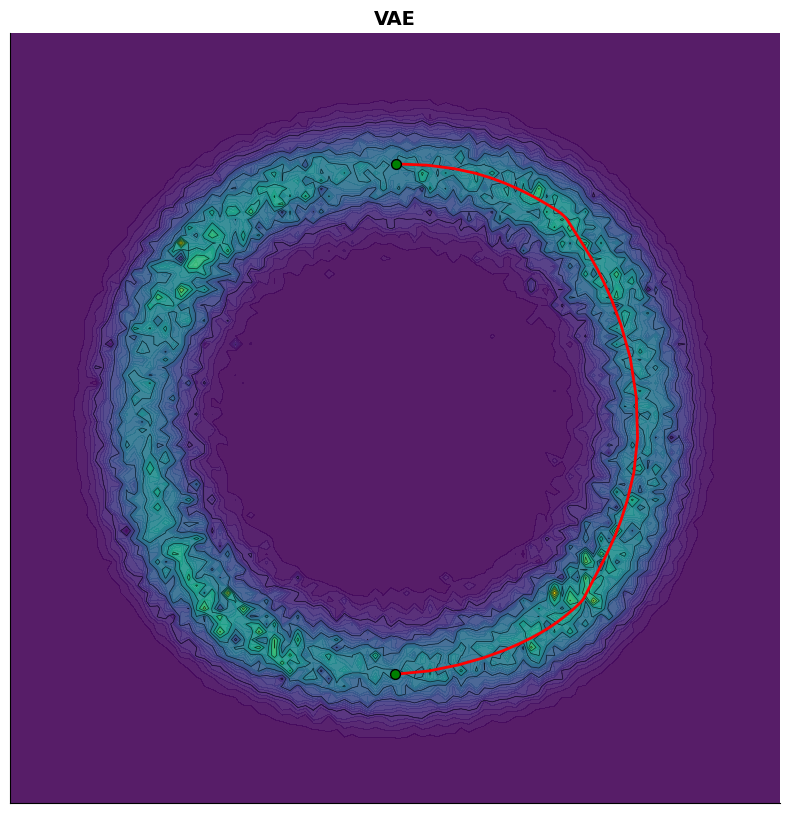

In [91]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_geodesic_plot(ax, vae_xv, vae_yv, vae_grid_density, curve1, title="VAE")

### Fréchet mean

In [92]:
prob_mean_adaptive = ProbGEORCEFM_Euclidean_Adaptive(reg_fun=vae_reg_fun,
                                                     init_fun=None,
                                                     lam=lam,
                                                     N_grid=N_grid,
                                                     tol=tol,
                                                     max_iter=max_iter,
                                                     lr_rate=lr_rate,
                                                     beta1=beta1,
                                                     beta2=beta2,
                                                     eps=eps,
                                                     device=device,
                                                    )

In [93]:
# Coordinates
grid = torch.linspace(-2*torch.pi,2*torch.pi,100)
dataz = torch.vstack([torch.cos(grid), torch.sin(grid), torch.zeros_like(grid)]).T   # top of moon 1
data_sample = vae_model.h(dataz)

In [94]:
z_mu, zi = prob_mean_adaptive(data_sample)

In [95]:
z_mu = vae_model.g(z_mu).detach().numpy()
zi = vae_model.g(zi).detach().numpy()
data_sample = data_sample.detach().numpy()

In [96]:
vae_computations['frechet_mean'] = {'z_mu': z_mu, 'zi': zi, 'lam_norm': prob_mean_adaptive.lam_norm}

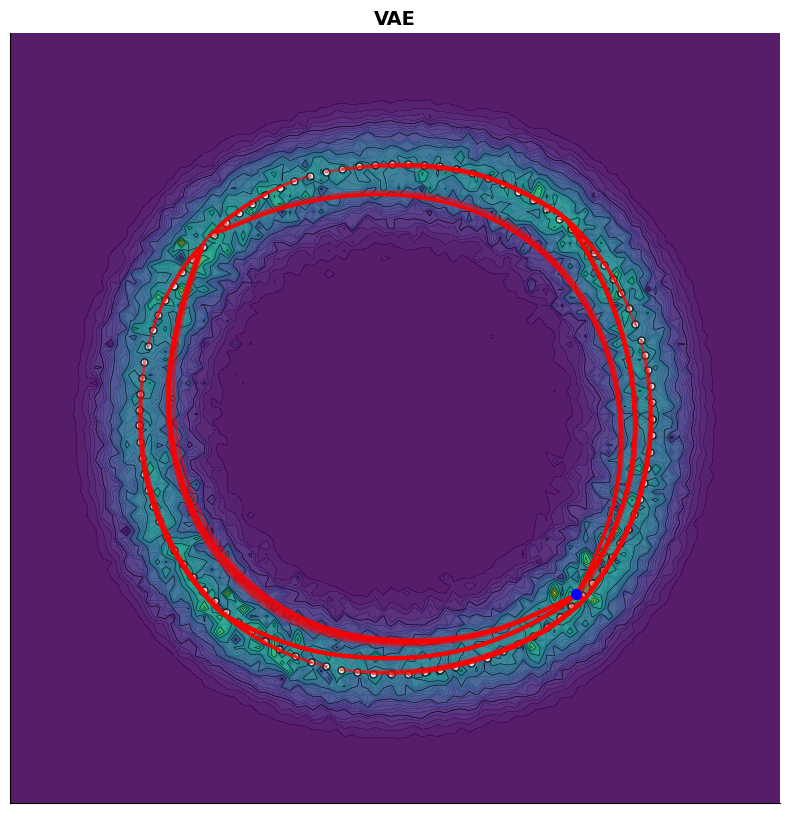

In [97]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_fm_plot(ax, vae_xv, vae_yv, vae_grid_density, z_mu, zi, title="VAE")

### ODE curves

In [98]:
Mlambda = LambdaManifold(M=M, S=vae_reg_fun, lam=lam)

In [99]:
x0_space = torch.tensor([math.cos(0.75*math.pi), math.sin(0.75*math.pi), 0.0])   # top of moon 1
x0 = vae_model.h(x0_space)

In [100]:
theta = torch.linspace(0, 2*torch.pi,10)
v = 2.0*v_scale*torch.stack([torch.cos(theta), torch.sin(theta)]).T

In [101]:
ode_curve = torch.stack([Mlambda.Exp_ode(x0, v0) for v0 in v])

In [102]:
x0 = x0_space.detach().numpy()[:2]
ode_curve = vae_model.g(ode_curve).detach().numpy()

In [103]:
vae_computations['ode'] = {'x0': x0, 'v': v, 'curve': ode_curve}

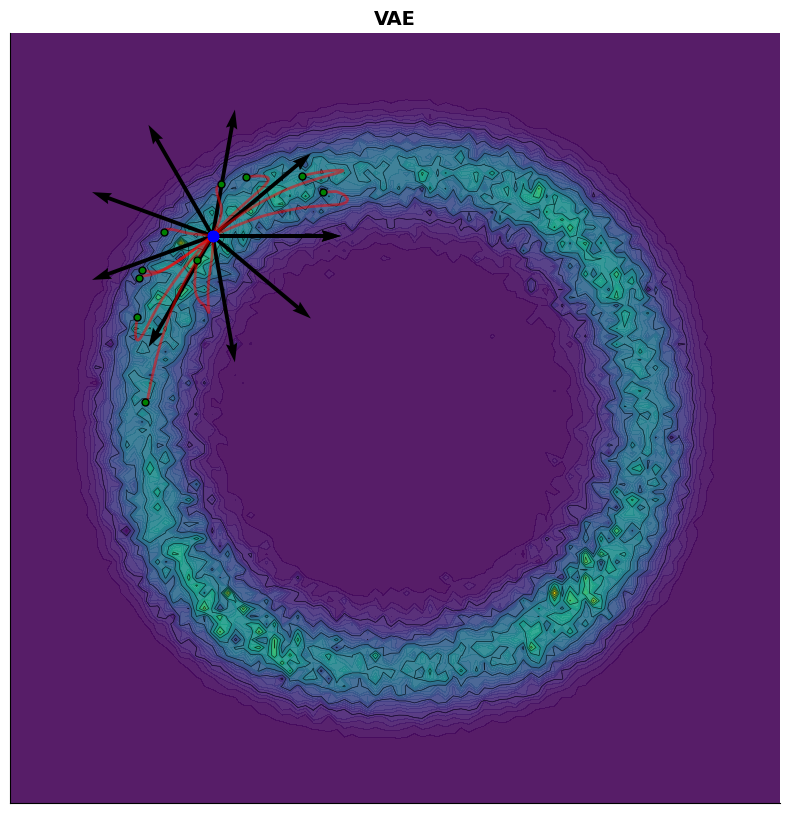

In [104]:
fig, ax = plt.subplots(figsize=(10, 10))

ax = plot_ode_curves(ax, vae_xv, vae_yv, vae_grid_density, ode_curve, v, title="VAE")

In [105]:
model_computations['VAE'] = vae_computations #Variational-autoencoder

## Plotting

### Single row plots

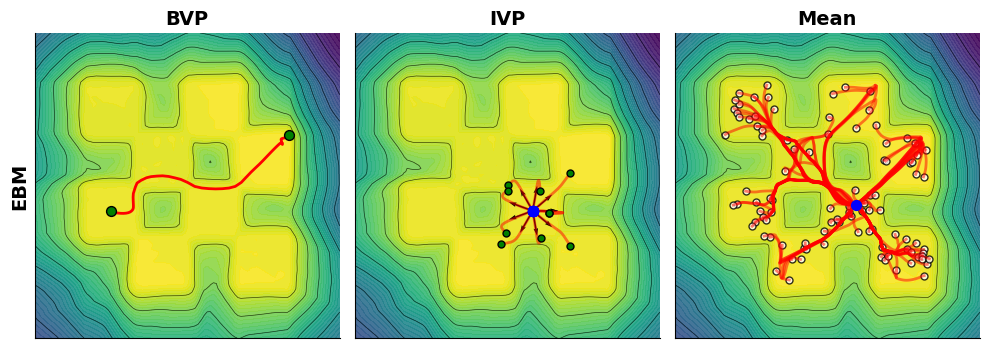

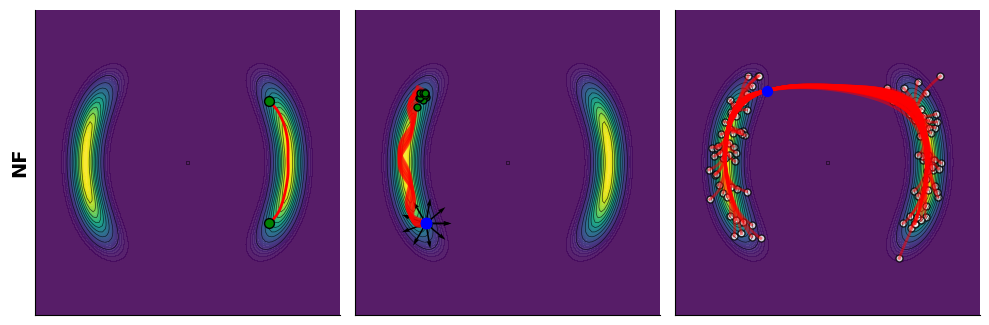

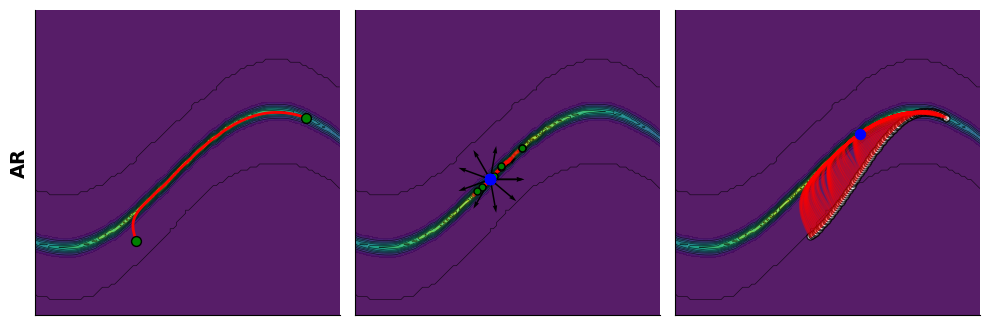

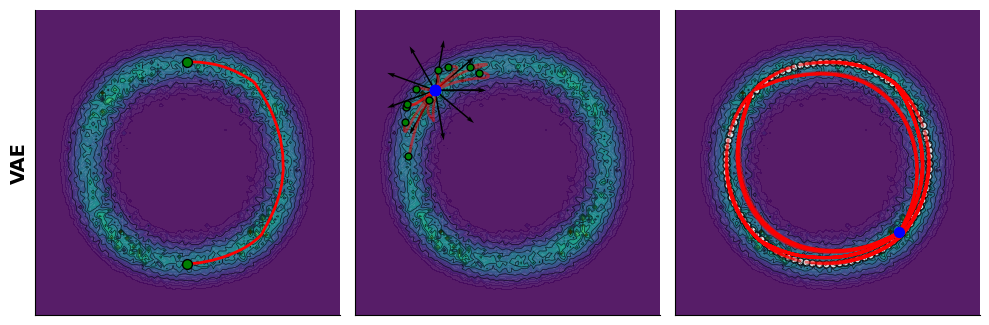

In [106]:
for idx, (key, val) in enumerate(model_computations.items(), start=1):

    fig = plt.figure(figsize=(10, 30))

    ax = fig.add_subplot(131)
    if idx == 1:
        ax = plot_geodesic_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'], val['geodesic_curve'], title="BVP")
    else:
        ax = plot_geodesic_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'], val['geodesic_curve'], title="")
    ax.set_ylabel(key, fontsize=14, fontweight='bold')

    ax = fig.add_subplot(132)
    if idx == 1:
        ax = plot_ode_curves(ax, val['x_grid'], val['y_grid'], val['grid_density'], val['ode']['curve'], val['ode']['v'], title="IVP")
    else:
        ax = plot_ode_curves(ax, val['x_grid'], val['y_grid'], val['grid_density'], val['ode']['curve'], val['ode']['v'], title="")
        
    ax = fig.add_subplot(133)
    if idx == 1:
        ax = plot_fm_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'],val['frechet_mean']['z_mu'], val['frechet_mean']['zi'], title="Mean")
    else:
        ax = plot_fm_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'],val['frechet_mean']['z_mu'], val['frechet_mean']['zi'], title="")

    fig.tight_layout()

    save_path = f'{figure_path}singlerow_plot_2d_gen_{key}.pdf'
    fig.savefig(save_path, format='pdf', pad_inches=0.1, bbox_inches='tight')
    plt.show()

### Multiple row plots

/tmp/ipykernel_113607/1023130995.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = mpl.cm.get_cmap(cmap_style)


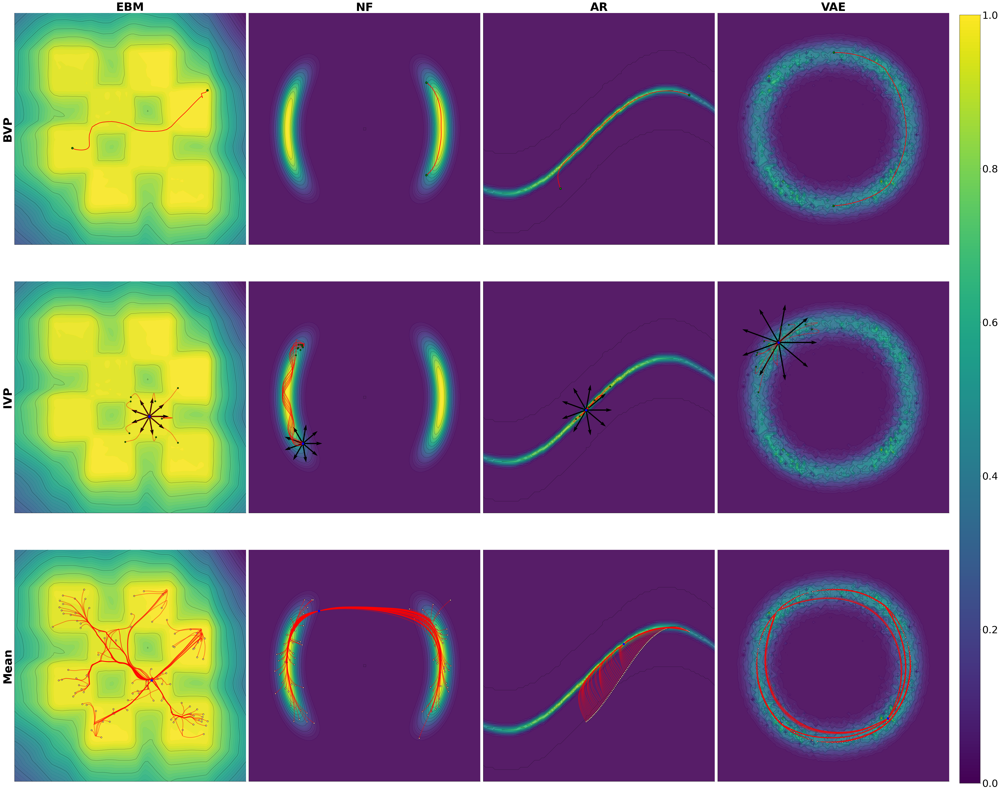

In [107]:
fig = plt.figure(figsize=(50, len(model_computations)*10))

for idx, (key, val) in enumerate(model_computations.items(), start=1):

    ax = fig.add_subplot(3,len(model_computations),idx + 0*len(model_computations))
    plot_geodesic_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'], 
                       val['geodesic_curve'], title=key, fontsize=40)
    if idx == 1:
        ax.set_ylabel("BVP", fontsize=40, fontweight='bold')

    ax = fig.add_subplot(3,len(model_computations),idx + 1*len(model_computations))
    plot_ode_curves(ax, val['x_grid'], val['y_grid'], val['grid_density'], 
                    val['ode']['curve'], val['ode']['v'], title="", fontsize=40)
    if idx == 1:
        ax.set_ylabel("IVP", fontsize=40, fontweight='bold')
    
    ax = fig.add_subplot(3,len(model_computations),idx + 2*len(model_computations))
    plot_fm_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'],
                 val['frechet_mean']['z_mu'], val['frechet_mean']['zi'], 
                 title="", fontsize=40)
    if idx == 1:
        ax.set_ylabel("Mean", fontsize=40, fontweight='bold')

fig.tight_layout()

# Create mappable for colorbar
cmap = mpl.cm.get_cmap(cmap_style)
norm = mpl.colors.Normalize(vmin=0, vmax=1)
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

# --- Compute space for a tall aligned colorbar ---
# This ensures the colorbar matches the height of the subplot area
fig.subplots_adjust(right=0.92)  # leave space for colorbar

# Add a new axis on the right side: [left, bottom, width, height]
cbar_ax = fig.add_axes([0.93, 0.03, 0.02, 0.93])  
# left  bottom width height  (all in figure coordinates)

cbar = fig.colorbar(sm, cax=cbar_ax)
cbar.ax.tick_params(labelsize=35)

save_path = f'{figure_path}multirow_plot_2d_gen.pdf'
fig.savefig(save_path, format='pdf', pad_inches=0.1, bbox_inches='tight')
plt.show()


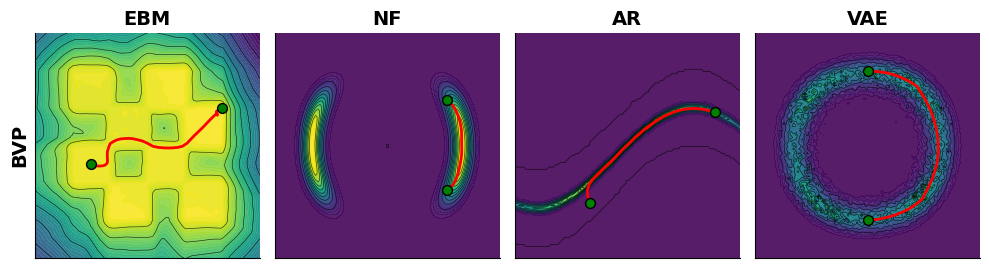

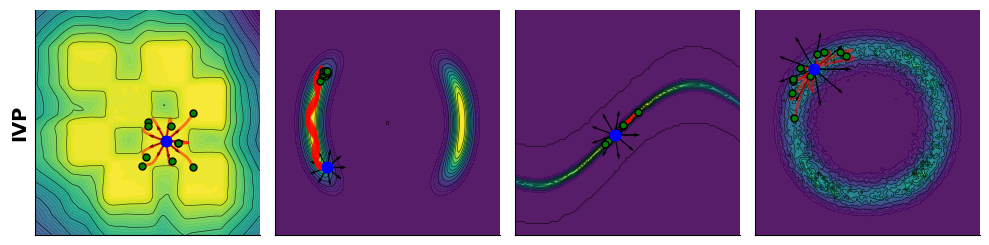

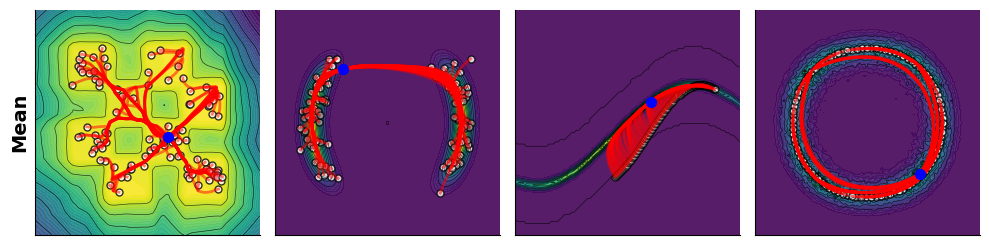

In [108]:
fig = plt.figure(figsize=(10, len(model_computations)*10))

for idx, (key, val) in enumerate(model_computations.items(), start=1):

    ax = fig.add_subplot(1,len(model_computations),idx)
    if key == "Variational-autoencoder":
        plot_geodesic_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'], 
                           val['geodesic_curve'], title="VAE", fontsize=14)
    else:
        plot_geodesic_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'], 
                           val['geodesic_curve'], title=key, fontsize=14)
    if idx == 1:
        ax.set_ylabel("BVP", fontsize=14, fontweight='bold')

fig.tight_layout()

save_path = f'{figure_path}multirow_plot_2d_gen_bvp.pdf'
fig.savefig(save_path, format='pdf', pad_inches=0.1, bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(10, len(model_computations)*10))

for idx, (key, val) in enumerate(model_computations.items(), start=1):

    ax = fig.add_subplot(1,len(model_computations),idx)
    plot_ode_curves(ax, val['x_grid'], val['y_grid'], val['grid_density'], 
                    val['ode']['curve'], val['ode']['v'], title="", fontsize=14)
    if idx == 1:
        ax.set_ylabel("IVP", fontsize=14, fontweight='bold')

fig.tight_layout()

save_path = f'{figure_path}multirow_plot_2d_gen_ivp.pdf'
fig.savefig(save_path, format='pdf', pad_inches=0.1, bbox_inches='tight')
plt.show()

fig = plt.figure(figsize=(10, len(model_computations)*10))

for idx, (key, val) in enumerate(model_computations.items(), start=1):
    
    ax = fig.add_subplot(1,len(model_computations),idx)
    plot_fm_plot(ax, val['x_grid'], val['y_grid'], val['grid_density'],
                 val['frechet_mean']['z_mu'], val['frechet_mean']['zi'], 
                 title="", fontsize=14)
    if idx == 1:
        ax.set_ylabel("Mean", fontsize=14, fontweight='bold')

fig.tight_layout()

save_path = f'{figure_path}multirow_plot_2d_gen_fm.pdf'
fig.savefig(save_path, format='pdf', pad_inches=0.1, bbox_inches='tight')
plt.show()


## Passing to low density areas